In [26]:
import numpy as np
from PIL import Image
import math
import matplotlib.pyplot as plt

In [27]:
import cv2

# Open the video file
video_capture = cv2.VideoCapture('Dataset//DatasetC.avi')  # Replace with your video file path

# Check if the video file is opened successfully
if not video_capture.isOpened():
    print("Error: Could not open video file.")
    exit()

# Loop through the frames and process each one

frames = []
while True:
    ret, frame = video_capture.read()

    if not ret:
        break  # Break the loop if we've reached the end of the video

    gray_image = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    frames.append(gray_image)


# # Release the video file and close the display window
video_capture.release()
cv2.destroyAllWindows()

In [28]:
def plot_frames(reference_frame, current_frame, frame_diff):
    plt.figure(figsize=(10, 6))

    # Plot the reference frame
    plt.subplot(131)
    plt.imshow(current_frame, cmap='gray')
    plt.title('Current Frame')

    # Plot the current frame
    plt.subplot(132)
    plt.imshow(reference_frame, cmap='gray')
    plt.title('Reference Frame')

    # Plot the absolute difference
    plt.subplot(133)
    plt.imshow(frame_diff, cmap='gray')
    plt.title('Difference')

    plt.show()

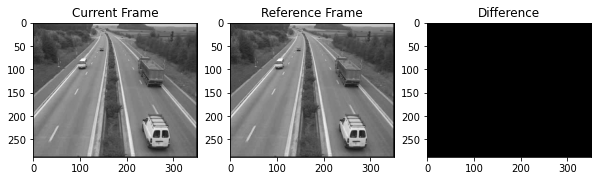

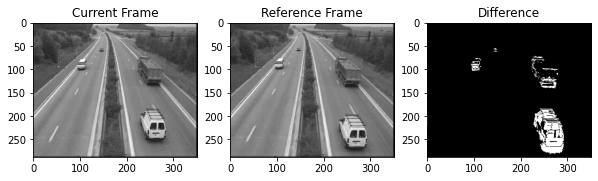

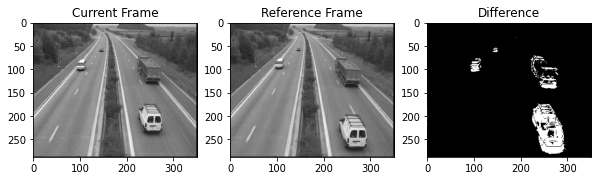

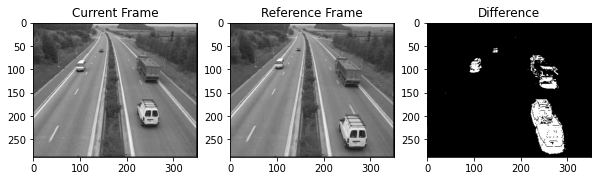

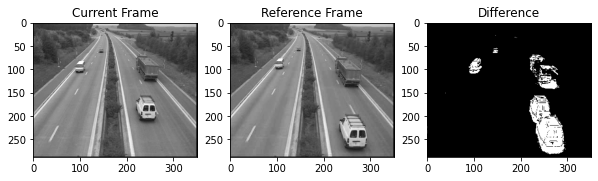

...

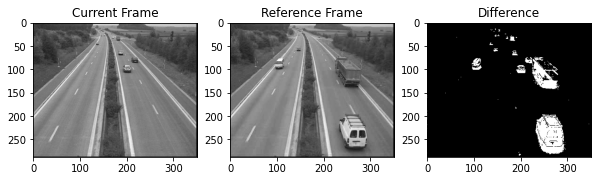

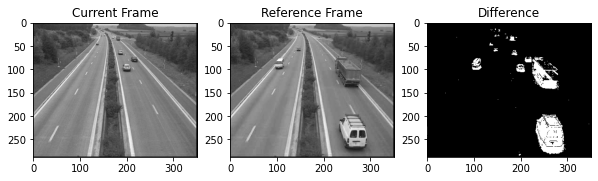

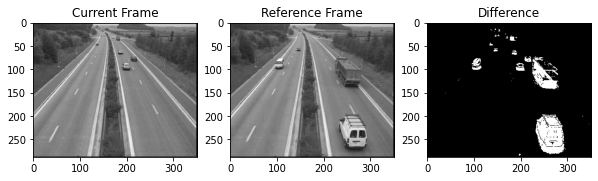

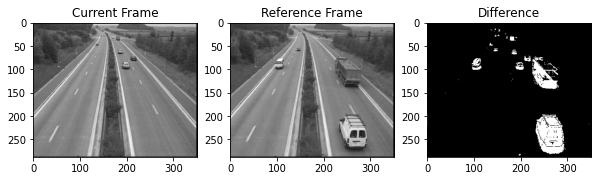

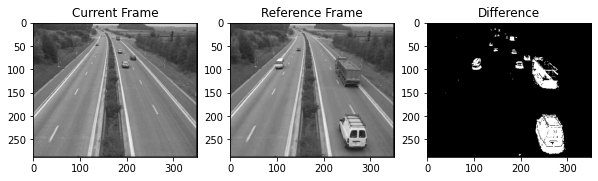

In [30]:
def frame_difference(all_frames):
    
    differences = []
    refrence_frame = all_frames[0]

    for frame in all_frames:
        
        frame_differences = np.abs(frame.astype(np.float32) - refrence_frame.astype(np.float32)).astype(np.uint8)
        
        # Calculate the threshold as the mean or median value of the absolute difference image
#         threshold = int(np.mean(frame_differences))  # Use np.median(frame_diff) for median

        # Apply the threshold to classify pixels as foreground or background
        
#         thresholded_frame = np.zeros_like(frame_differences)
        thresholded_frame[frame_differences >= 30] = 255
        
        differences.append(thresholded_frame)
    
    for i in range(len(all_frames)):
        plot_frames(refrence_frame,all_frames[i], differences[i])
    
    
frame_difference(frames)

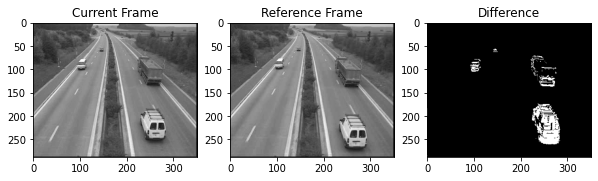

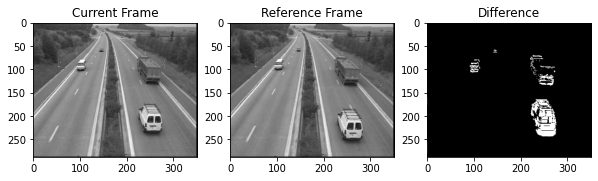

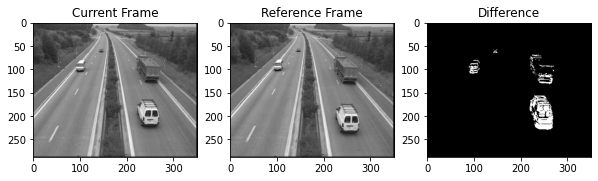

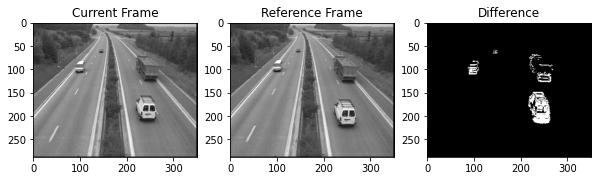

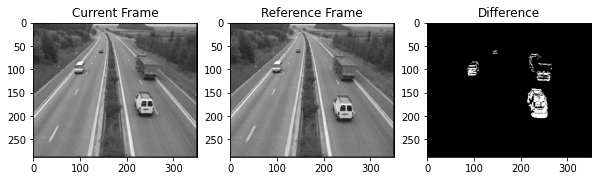

...

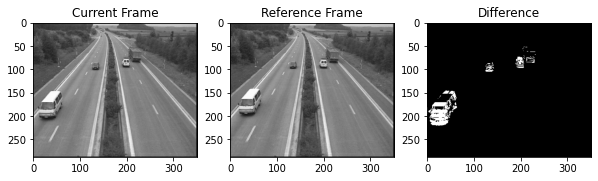

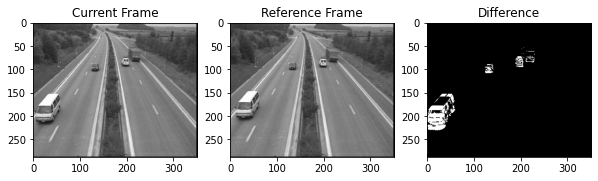

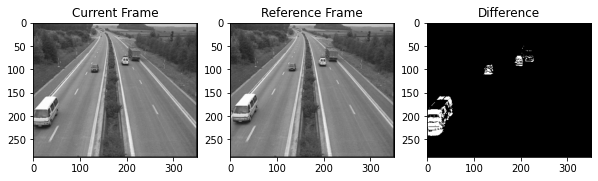

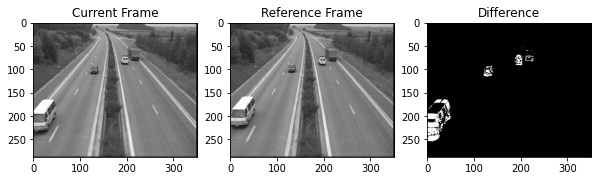

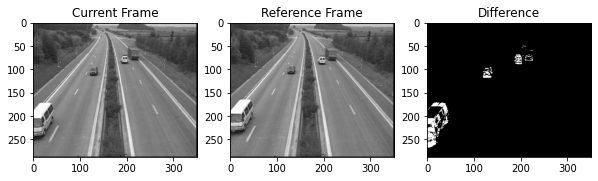

In [ ]:
def consecutive_frame_difference(all_frames):
    
    differences = []

    for i in range(1,len(all_frames)):
        
        frame_differences = np.abs(all_frames[i].astype(np.float32) - all_frames[i-1].astype(np.float32)).astype(np.uint8)
        
        # Calculate the threshold as the mean or median value of the absolute difference image
#         threshold = int(np.mean(frame_differences))  # Use np.median(frame_diff) for median

        # Apply the threshold to classify pixels as foreground or background
        
        thresholded_frame = np.zeros_like(frame_differences)
        thresholded_frame[frame_differences >= 30] = 255
        
        differences.append(thresholded_frame)
    
    for i in range(1,len(all_frames)):
        plot_frames(all_frames[i-1],all_frames[i], differences[i])
    
    
consecutive_frame_difference(frames)